In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 45.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 44.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="5Fxc7twyOz7DkJx5qyjz")
project = rf.workspace("effrab").project("pi-siz")
version = project.version(1)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 86.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to pi-siz-1 in yolov11:: 100%|██████████| 2626/2626 [00:00<00:00, 5772.68it/s]


In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.8/112.6 GB disk)


In [4]:
import os
from collections import defaultdict

# Replace with your actual dataset paths
splits = {
    'train': '/content/pi-siz-1/train/labels',
    'valid': '/content/pi-siz-1/valid/labels',
    'test': '/content/pi-siz-1/test/labels'
}

# Assuming class_id 0 = gloves, 1 = hat, 2 = no_gloves, 3 = no_hat

# Correct the assignment of class_names from a type hint to a variable
class_names = ['gloves', 'hairnet', 'no_gloves', 'no_hairnet']

results = defaultdict(lambda: [0] * len(class_names))

for split, path in splits.items():
    for label_file in os.listdir(path):
        if label_file.endswith('.txt'):
            with open(os.path.join(path, label_file), 'r') as f:
                for line in f:
                    class_id = int(line.strip().split()[0])
                    # Ensure the class_id is within the bounds of the results list
                    if 0 <= class_id < len(class_names):
                         results[split][class_id] += 1
                    else:
                         print(f"Warning: Found unexpected class_id {class_id} in file {os.path.join(path, label_file)}")


# Print in table format - update the header and the print statement
# to reflect the actual class names and counts
# Update the header to match the defined class names
header = f"{'Split':<10} {'Total':<8}"
for name in class_names:
    header += f" {name.capitalize():<{len(name) + 4}}" # Adjust padding dynamically
print(header)

# Adjust the separator length based on the header length
print("-" * len(header))

for split, counts in results.items():
    total = sum(counts)
    # Ensure counts list has enough elements before accessing
    # This padding is still useful if a split is missing certain classes entirely
    padded_counts = counts + [0] * (len(class_names) - len(counts))

    # Construct the row string dynamically based on class_names
    row = f"{split.capitalize():<10} {total:<8}"
    for i in range(len(class_names)):
        row += f" {padded_counts[i]:<{len(class_names[i]) + 4}}"

    print(row)

Split      Total    Gloves     Hairnet     No_gloves     No_hairnet    
-----------------------------------------------------------------------
Train      4088     664        1707        1512          205           
Valid      406      67         169         153           17            
Test       184      24         79          71            10            


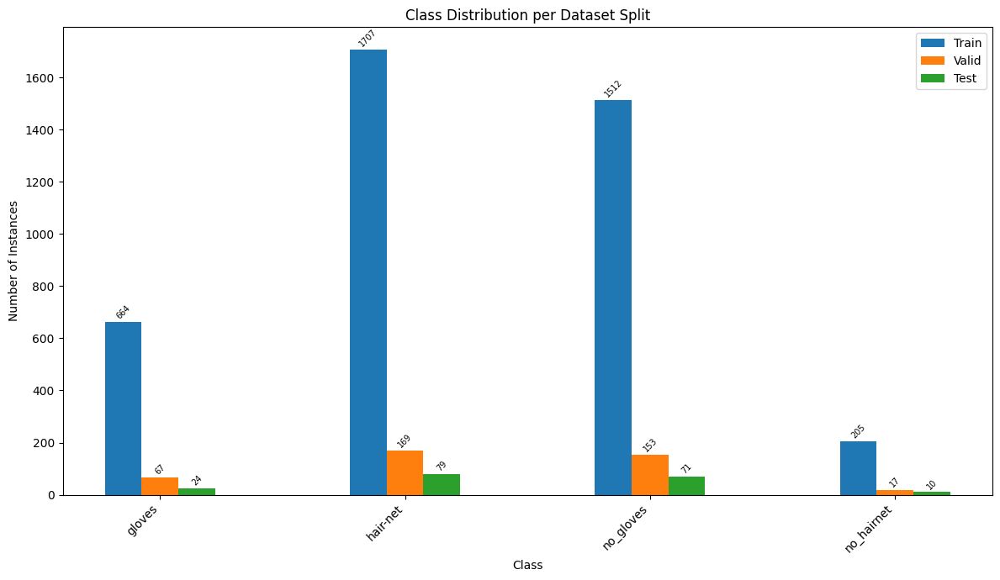

In [5]:
import matplotlib.pyplot as plt
import numpy as np


results = {
     'train': [664, 1707, 1512, 205 ],
     'valid': [67 ,169, 153, 17 ],
     'test': [24, 79, 71, 10 ]
 }
class_names = ['gloves', 'hair-net', 'no_gloves','no_hairnet']


splits = list(results.keys())

# Bar chart settings
x = np.arange(len(class_names))  # the label locations
bar_width = 0.15  # Adjust bar width for more classes

fig, ax = plt.subplots(figsize=(12, 7)) # Adjust figure size

# Plot each dataset split
for i, split in enumerate(splits):
    counts = results[split]
    # Adjust bar positions to accommodate more bars for more classes
    bar_positions = x + (i - (len(splits) - 1) / 2) * bar_width
    bars = ax.bar(bar_positions, counts, bar_width, label=split.capitalize()) # Capitalize split names for legend
    for bar in bars:
        height = bar.get_height()
        # Adjust text position slightly for better readability
        ax.text(bar.get_x() + bar.get_width() / 2, height + 5, f'{height}',
                ha='center', va='bottom', fontsize=7, rotation=45) # Rotate text for better fit

# Axis settings
ax.set_xlabel('Class')
ax.set_ylabel('Number of Instances')
ax.set_title('Class Distribution per Dataset Split')
# Set x-ticks in the middle of the group of bars for each class
ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=45, ha='right') # Rotate x-tick labels
ax.legend()

plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()

## Sample Training Set

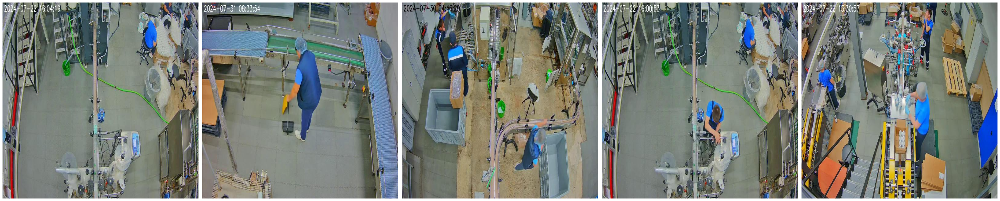

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Set the directory for training images
train_image_dir = '/content/pi-siz-1/train/images'

# Get a list of image files in the training directory
image_files = [f for f in os.listdir(train_image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Take the first 5 image files
images_to_display = image_files[:5]

if len(images_to_display) < 5:
    print("Less than 5 images found in the training directory.")

# Create a 1x5 grid of subplots
fig, axes = plt.subplots(1, 5, figsize=(40,15)) # Adjust figure size as needed

# Ensure axes is an array even if there's only one image
if len(images_to_display) == 1:
    axes = [axes]

for i, img_file in enumerate(images_to_display):
    if i < len(axes): # Ensure we don't go out of bounds if less than 5 images are found
        img_path = os.path.join(train_image_dir, img_file)
        img = mpimg.imread(img_path)
        axes[i].imshow(img)
        axes[i].axis('off') # Hide axes
    else:
        # Hide any unused subplots if less than 5 images are displayed
        for j in range(i, len(axes)):
            axes[j].axis('off')
        break

plt.tight_layout()
plt.show()

In [7]:
import os
from collections import defaultdict

splits = {
    'train': '/content/pi-siz-1/train/labels',
    'valid': '/content/pi-siz-1/valid/labels',
    'test': '/content/pi-siz-1/test/labels'
}

# Define annotation count ranges
ranges = {
    '1–2': lambda x: 1 <= x <= 2,
    '3–5': lambda x: 3 <= x <= 5,
    '6–10': lambda x: 6 <= x <= 10,
    '11–15': lambda x: 11 <= x <= 15
}

# Results: split -> range -> count
table_counts = defaultdict(lambda: defaultdict(int))
total_images = {}

# Count annotations per image and group into ranges
for split_name, label_dir in splits.items():
    counts = []
    for label_file in os.listdir(label_dir):
        if label_file.endswith('.txt'):
            with open(os.path.join(label_dir, label_file), 'r') as f:
                lines = f.readlines()
                annotation_count = len(lines)
                counts.append(annotation_count)

                for range_name, cond in ranges.items():
                    if cond(annotation_count):
                        table_counts[split_name][range_name] += 1

    total_images[split_name] = len(counts)

# --- Print Table ---
print(f"{'Split':<12} {'Total Img':<10} {'1–2':<6} {'3–5':<6} {'6–10':<6} {'11–15':<6}")
print("-" * 60)
for split in splits.keys():
    print(f"{split:<12} {total_images[split]:<10} "
          f"{table_counts[split]['1–2']:<6} {table_counts[split]['3–5']:<6} "
          f"{table_counts[split]['6–10']:<6} {table_counts[split]['11–15']:<6}")

# --- Print Percentages ---
print("\nPercentages (%):")
print(f"{'Split':<12} {'1–2':<6} {'3–5':<6} {'6–10':<6} {'11–15':<6}")
print("-" * 50)
for split in splits.keys():
    total = total_images[split]
    print(f"{split:<12} "
          f"{(table_counts[split]['1–2'] / total * 100):<6.1f} "
          f"{(table_counts[split]['3–5'] / total * 100):<6.1f} "
          f"{(table_counts[split]['6–10'] / total * 100):<6.1f} "
          f"{(table_counts[split]['11–15'] / total * 100):<6.1f}")


Split        Total Img  1–2    3–5    6–10   11–15 
------------------------------------------------------------
train        1150       393    516    225    3     
valid        105        34     44     26     1     
test         52         21     21     9      1     

Percentages (%):
Split        1–2    3–5    6–10   11–15 
--------------------------------------------------
train        34.2   44.9   19.6   0.3   
valid        32.4   41.9   24.8   1.0   
test         40.4   40.4   17.3   1.9   


In [8]:

from ultralytics import YOLO

model = YOLO('yolo11n.pt')
model.train(data = '/content/pi-siz-1/data.yaml', epochs = 50 , imgsz = 640 , batch = 64 )

100%|██████████| 5.35M/5.35M [00:00<00:00, 381MB/s]

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/pi-siz-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=

100%|██████████| 755k/755k [00:00<00:00, 95.1MB/s]

Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

YOLO11n summary: 181 layers, 2,590,620 parameters, 2,590,604 gradients, 6.4 GFLOPs

Transferred 448/499 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1363.8±597.9 MB/s, size: 61.4 KB)


train: Scanning /content/pi-siz-1/train/labels... 1150 images, 13 backgrounds, 0 corrupt: 100%|██████████| 1150/1150 [00:00<00:00, 2320.29it/s]


train: New cache created: /content/pi-siz-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1260.3±767.0 MB/s, size: 77.1 KB)


val: Scanning /content/pi-siz-1/valid/labels... 105 images, 0 backgrounds, 0 corrupt: 100%|██████████| 105/105 [00:00<00:00, 1436.09it/s]

val: New cache created: /content/pi-siz-1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.84G      1.832      4.579      1.325        263        640: 100%|██████████| 18/18 [00:21<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.04s/it]

                   all        105        406    0.00241      0.068     0.0189     0.0112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      8.26G      1.358      2.621      1.051        278        640: 100%|██████████| 18/18 [00:16<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

                   all        105        406    0.00264      0.129     0.0405     0.0282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      8.32G      1.202      1.727      1.004        255        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

                   all        105        406    0.00366      0.129     0.0858     0.0712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      8.17G      1.185      1.439      1.001        272        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]

                   all        105        406          1     0.0576      0.264      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      8.17G      1.174      1.292     0.9864        305        640: 100%|██████████| 18/18 [00:16<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all        105        406      0.996      0.117       0.46       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      8.21G      1.157      1.218      0.978        315        640: 100%|██████████| 18/18 [00:16<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]

                   all        105        406      0.995     0.0716      0.399       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      8.33G      1.145      1.096     0.9786        319        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all        105        406          1      0.105      0.402      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       8.2G      1.128      1.011     0.9672        342        640: 100%|██████████| 18/18 [00:16<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]

                   all        105        406       0.85      0.506      0.674      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.39G      1.097     0.9612     0.9584        297        640: 100%|██████████| 18/18 [00:17<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

                   all        105        406      0.768      0.585       0.69      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      8.38G      1.086     0.9087      0.955        266        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

                   all        105        406      0.746      0.642       0.74      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      8.23G       1.09     0.8771     0.9547        269        640: 100%|██████████| 18/18 [00:16<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

                   all        105        406      0.826      0.702      0.785      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      8.29G       1.06      0.825     0.9454        278        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]

                   all        105        406       0.81       0.71      0.794      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      8.29G      1.048     0.7964     0.9381        318        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.00s/it]

                   all        105        406      0.828      0.752      0.824      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      8.22G       1.05     0.7787     0.9441        278        640: 100%|██████████| 18/18 [00:16<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]

                   all        105        406      0.829      0.767      0.812      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      8.32G       1.03     0.7372     0.9304        314        640: 100%|██████████| 18/18 [00:16<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]

                   all        105        406      0.814       0.76      0.815      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       8.2G      1.022     0.7211      0.926        311        640: 100%|██████████| 18/18 [00:16<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]

                   all        105        406      0.859      0.749      0.817      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       8.4G      1.011     0.7121     0.9237        328        640: 100%|██████████| 18/18 [00:17<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all        105        406      0.881       0.78      0.846      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       8.2G      1.001     0.6971     0.9216        294        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all        105        406      0.847      0.724      0.851      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.35G     0.9969     0.6726      0.922        273        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]

                   all        105        406      0.855      0.776      0.865      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      8.21G     0.9834      0.666     0.9174        284        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]

                   all        105        406      0.901      0.786      0.868      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       8.2G     0.9821     0.6687     0.9188        283        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

                   all        105        406       0.89      0.784      0.866      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      8.27G     0.9812     0.6523     0.9159        274        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]

                   all        105        406      0.872      0.823      0.857      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      8.32G     0.9635     0.6437     0.9085        291        640: 100%|██████████| 18/18 [00:16<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

                   all        105        406      0.898      0.799      0.865      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      8.18G     0.9737     0.6257     0.9124        367        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]

                   all        105        406       0.91      0.787      0.873      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       8.3G     0.9413     0.6121     0.9041        345        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]

                   all        105        406      0.861      0.835       0.89      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      8.31G      0.948     0.6086      0.905        306        640: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all        105        406      0.883      0.786      0.888      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      8.36G      0.934     0.6009     0.9077        286        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]

                   all        105        406      0.905      0.782      0.886      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      8.19G     0.9376      0.592     0.8967        286        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]

                   all        105        406      0.877      0.791      0.875      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      8.34G     0.9379     0.5955     0.8974        298        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]

                   all        105        406      0.865      0.859      0.899      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       8.3G     0.9312     0.5745     0.9004        303        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]

                   all        105        406      0.878       0.83      0.894      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      8.24G       0.91     0.5729     0.8936        295        640: 100%|██████████| 18/18 [00:18<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all        105        406      0.857      0.842      0.905      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.38G     0.9229     0.5785     0.8895        273        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all        105        406      0.895      0.845      0.895      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       8.3G     0.9053     0.5626     0.8881        326        640: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]

                   all        105        406      0.855      0.865      0.909      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       8.2G     0.9013     0.5563     0.8858        255        640: 100%|██████████| 18/18 [00:16<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]

                   all        105        406      0.885      0.868      0.909       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      8.35G     0.9079     0.5444     0.8879        299        640: 100%|██████████| 18/18 [00:17<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all        105        406      0.865      0.879      0.911      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      8.26G     0.8827     0.5439     0.8821        272        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

                   all        105        406      0.917       0.87      0.922      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      8.21G     0.8845     0.5407     0.8861        323        640: 100%|██████████| 18/18 [00:16<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

                   all        105        406       0.93      0.824      0.909      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      8.21G     0.8869     0.5357     0.8798        281        640: 100%|██████████| 18/18 [00:17<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]

                   all        105        406      0.857      0.876      0.912      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.37G     0.8713     0.5257     0.8786        314        640: 100%|██████████| 18/18 [00:17<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]

                   all        105        406      0.928      0.842      0.915      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      8.34G     0.8675     0.5168     0.8838        280        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all        105        406      0.922      0.865      0.919      0.678


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      8.22G     0.8559     0.5132     0.8881        198        640: 100%|██████████| 18/18 [00:22<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

                   all        105        406      0.892      0.864       0.92      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      8.16G     0.8399     0.4922     0.8797        191        640: 100%|██████████| 18/18 [00:16<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]

                   all        105        406      0.923      0.841      0.922      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      8.17G     0.8228     0.4842     0.8735        200        640: 100%|██████████| 18/18 [00:16<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all        105        406      0.908      0.875      0.924       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      8.21G     0.8193     0.4812     0.8708        206        640: 100%|██████████| 18/18 [00:16<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]

                   all        105        406      0.906      0.872      0.914      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      8.22G     0.8098     0.4703      0.867        185        640: 100%|██████████| 18/18 [00:16<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]

                   all        105        406      0.885       0.88      0.918      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      8.23G     0.8029     0.4674      0.868        196        640: 100%|██████████| 18/18 [00:16<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]

                   all        105        406      0.886       0.88      0.924      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      8.23G     0.8045     0.4632     0.8661        208        640: 100%|██████████| 18/18 [00:15<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

                   all        105        406      0.903      0.873      0.922      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      8.22G     0.7814      0.448     0.8647        219        640: 100%|██████████| 18/18 [00:15<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]

                   all        105        406      0.908      0.884      0.923      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      8.16G     0.7965     0.4549     0.8693        215        640: 100%|██████████| 18/18 [00:15<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

                   all        105        406      0.928      0.884      0.924      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      8.22G     0.7855     0.4475      0.869        227        640: 100%|██████████| 18/18 [00:16<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]

                   all        105        406      0.932      0.883      0.927      0.682



50 epochs completed in 0.285 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


                   all        105        406      0.932      0.884      0.927       0.68
                gloves         31         67      0.912      0.836      0.871      0.607
               hairnet        100        169      0.949      0.986      0.985      0.841
             no_gloves         76        153      0.893      0.771      0.871      0.498
            no_hairnet         17         17      0.975      0.941      0.982      0.773
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cc97a380190>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [9]:
results = model.predict(source='/content/pi-siz-1/test/images', save=True)


image 1/52 /content/pi-siz-1/test/images/camera-10_2024-07-31T14-04-24_2024-07-31T14-14-24_26_jpg.rf.4c20187d2af70301e23df70505bebd2f.jpg: 640x640 2 hairnets, 2 no_glovess, 7.9ms
image 2/52 /content/pi-siz-1/test/images/camera-11_2024-07-23T07-58-28_2024-07-23T08-08-28_36_jpg.rf.426506541a6253f9e60814d3e457af5b.jpg: 640x640 1 hairnet, 8.2ms
image 3/52 /content/pi-siz-1/test/images/camera-11_2024-07-29T09-48-35_2024-07-29T09-58-35_7_jpg.rf.c46105a4b280f2c6079e0ec1c7e6186b.jpg: 640x640 1 hairnet, 1 no_gloves, 11.6ms
image 4/52 /content/pi-siz-1/test/images/camera-12_2024-07-30T08-03-56_2024-07-30T08-13-56_27_jpg.rf.3354e5a51e9d73cfcffd23858273dad5.jpg: 640x640 2 glovess, 3 hairnets, 1 no_gloves, 8.7ms
image 5/52 /content/pi-siz-1/test/images/camera-12_2024-07-30T08-03-56_2024-07-30T08-13-56_37_jpg.rf.91ec431a3192f8f60a340aac477cdcf8.jpg: 640x640 1 gloves, 3 hairnets, 1 no_gloves, 11.2ms
image 6/52 /content/pi-siz-1/test/images/camera-12_2024-07-30T08-03-56_2024-07-30T08-13-56_41_jpg.rf.

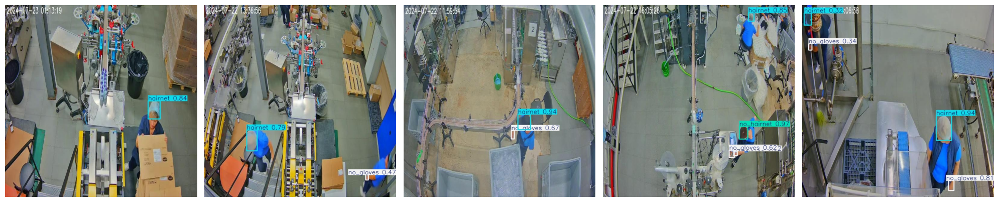

In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Assuming 'results' contains the paths to the saved predicted images
# You might need to adjust the directory path based on your 'save' location
predicted_image_dir = '/content/runs/detect/train2' # Example path

# Get a list of image files in the prediction directory
image_files = [f for f in os.listdir(predicted_image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Take the first 5 image files
images_to_display = image_files[:5]

if len(images_to_display) < 5:
    print("Less than 5 images found in the prediction directory.")

fig, axes = plt.subplots(1, len(images_to_display), figsize=(20, 5)) # Adjust figure size as needed

# Ensure axes is an array even if there's only one image
if len(images_to_display) == 1:
    axes = [axes]

for i, img_file in enumerate(images_to_display):
    img_path = os.path.join(predicted_image_dir, img_file)
    img = mpimg.imread(img_path)
    axes[i].imshow(img)
    axes[i].axis('off') # Hide axes

plt.tight_layout()
plt.show()

##Add 25 epoch from the best

In [11]:
model2 = YOLO('/content/runs/detect/train/weights/best.pt')
model2.train(data = '/content/pi-siz-1/data.yaml', epochs =  50, imgsz = 640 , batch = 64 )

Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/pi-siz-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/train/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, p

train: Scanning /content/pi-siz-1/train/labels.cache... 1150 images, 13 backgrounds, 0 corrupt: 100%|██████████| 1150/1150 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 752.6±441.8 MB/s, size: 77.1 KB)


val: Scanning /content/pi-siz-1/valid/labels.cache... 105 images, 0 backgrounds, 0 corrupt: 100%|██████████| 105/105 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       8.6G     0.8376      0.507     0.8686        263        640: 100%|██████████| 18/18 [00:21<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]

                   all        105        406      0.928       0.87      0.927      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      8.32G     0.8509     0.5006     0.8731        278        640: 100%|██████████| 18/18 [00:17<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]

                   all        105        406      0.905      0.842      0.906      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      8.39G     0.8592     0.5199     0.8711        255        640: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all        105        406      0.898      0.855      0.908      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      8.37G     0.9055     0.5448     0.8844        272        640: 100%|██████████| 18/18 [00:17<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]

                   all        105        406      0.929      0.821      0.902      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      8.23G     0.9288     0.5769     0.8925        305        640: 100%|██████████| 18/18 [00:18<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]

                   all        105        406       0.91      0.829      0.883      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      8.27G     0.9286     0.5966     0.8926        315        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]

                   all        105        406      0.862       0.81      0.857      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      8.39G     0.9375     0.5952     0.9003        319        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

                   all        105        406      0.857      0.777      0.858      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.27G     0.9461     0.5931     0.8976        342        640: 100%|██████████| 18/18 [00:18<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all        105        406      0.853      0.814      0.867      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.27G     0.9333     0.5887     0.8966        297        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

                   all        105        406      0.888        0.8      0.857      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      8.44G     0.9401     0.5909     0.8985        266        640: 100%|██████████| 18/18 [00:18<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

                   all        105        406      0.841      0.775      0.848      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      8.29G     0.9469     0.5833     0.8966        269        640: 100%|██████████| 18/18 [00:17<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]

                   all        105        406      0.913      0.771      0.869      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      8.36G     0.9181     0.5708      0.894        278        640: 100%|██████████| 18/18 [00:17<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all        105        406      0.883      0.802      0.872      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      8.36G     0.9189     0.5726     0.8895        318        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all        105        406      0.815      0.815      0.882      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      8.28G     0.9137     0.5646     0.8916        278        640: 100%|██████████| 18/18 [00:17<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all        105        406      0.901      0.787       0.89      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      8.39G     0.9133     0.5546     0.8871        314        640: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all        105        406      0.901      0.875      0.914       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      8.26G     0.9039     0.5445     0.8853        311        640: 100%|██████████| 18/18 [00:16<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]

                   all        105        406      0.875      0.821      0.881      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      8.46G     0.8918     0.5464     0.8795        328        640: 100%|██████████| 18/18 [00:18<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

                   all        105        406      0.902       0.83      0.911      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      8.26G     0.9007     0.5392     0.8827        294        640: 100%|██████████| 18/18 [00:18<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

                   all        105        406      0.854      0.818      0.876      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.41G     0.8823     0.5233     0.8842        273        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

                   all        105        406       0.87      0.889      0.911      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      8.28G     0.8881     0.5204     0.8816        284        640: 100%|██████████| 18/18 [00:17<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

                   all        105        406      0.877      0.877      0.907      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      8.26G      0.892      0.526     0.8871        283        640: 100%|██████████| 18/18 [00:17<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]

                   all        105        406      0.885      0.872      0.909       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      8.33G     0.8813     0.5207     0.8797        274        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]

                   all        105        406      0.883      0.859      0.907       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      8.38G     0.8614     0.5171     0.8745        291        640: 100%|██████████| 18/18 [00:16<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]

                   all        105        406      0.902      0.856      0.906      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      8.24G     0.8792     0.5214     0.8792        367        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]

                   all        105        406      0.878      0.872      0.916      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      8.41G     0.8591      0.503      0.875        345        640: 100%|██████████| 18/18 [00:17<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

                   all        105        406      0.903      0.866      0.926      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      8.37G     0.8683     0.5053     0.8781        306        640: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]

                   all        105        406      0.935      0.849      0.919      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      8.42G       0.85     0.5023     0.8769        286        640: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

                   all        105        406      0.889      0.867      0.926      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      8.25G     0.8535     0.4987     0.8693        286        640: 100%|██████████| 18/18 [00:17<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all        105        406      0.923      0.811      0.911      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       8.4G     0.8543     0.5005     0.8697        298        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all        105        406      0.902      0.886      0.924      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      8.45G     0.8464     0.4862     0.8724        303        640: 100%|██████████| 18/18 [00:18<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]

                   all        105        406       0.89      0.882      0.919      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      8.31G     0.8283      0.483     0.8663        295        640: 100%|██████████| 18/18 [00:18<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]

                   all        105        406      0.921      0.891      0.927      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.44G     0.8426     0.4882     0.8641        273        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all        105        406      0.912      0.892      0.923      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      8.37G      0.831     0.4765     0.8644        326        640: 100%|██████████| 18/18 [00:17<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

                   all        105        406      0.875      0.884      0.923      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      8.26G     0.8186     0.4761     0.8624        255        640: 100%|██████████| 18/18 [00:17<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]

                   all        105        406      0.899      0.897      0.926      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      8.24G     0.8218      0.466     0.8622        299        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]

                   all        105        406      0.906       0.89      0.931       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      8.32G     0.8131     0.4685     0.8611        272        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]

                   all        105        406      0.893      0.881      0.931      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      8.27G     0.8141      0.469     0.8616        323        640: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

                   all        105        406      0.928      0.868      0.935      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      8.27G     0.8127     0.4586     0.8575        281        640: 100%|██████████| 18/18 [00:18<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all        105        406      0.922      0.871      0.928      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.26G     0.8012     0.4541     0.8587        314        640: 100%|██████████| 18/18 [00:18<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all        105        406      0.907      0.893      0.924       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      8.42G     0.8006      0.453     0.8635        280        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]

                   all        105        406      0.928      0.875      0.929       0.68


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      8.28G     0.7817     0.4387     0.8625        198        640: 100%|██████████| 18/18 [00:20<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]

                   all        105        406      0.916      0.881      0.923      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      8.22G     0.7713     0.4272     0.8555        191        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all        105        406      0.909      0.896      0.931      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      8.23G     0.7502     0.4157       0.85        200        640: 100%|██████████| 18/18 [00:17<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all        105        406      0.917      0.896      0.939      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      8.27G     0.7548     0.4133     0.8496        206        640: 100%|██████████| 18/18 [00:16<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]

                   all        105        406      0.912      0.903       0.94      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      8.28G     0.7435     0.4099     0.8468        185        640: 100%|██████████| 18/18 [00:16<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

                   all        105        406      0.921      0.897      0.938      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      8.29G      0.748      0.407     0.8496        196        640: 100%|██████████| 18/18 [00:17<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]

                   all        105        406      0.937      0.887      0.942      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      8.29G     0.7422     0.4023     0.8467        208        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]

                   all        105        406      0.922       0.89      0.942      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      8.28G     0.7268     0.3933     0.8466        219        640: 100%|██████████| 18/18 [00:16<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all        105        406      0.926      0.895      0.943      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      8.22G     0.7424     0.3991     0.8524        215        640: 100%|██████████| 18/18 [00:16<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

                   all        105        406      0.923      0.894       0.94      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      8.28G     0.7366     0.3959     0.8523        227        640: 100%|██████████| 18/18 [00:17<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all        105        406      0.931      0.901      0.943      0.695



50 epochs completed in 0.295 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 5.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.155 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


                   all        105        406      0.925      0.895      0.943      0.697
                gloves         31         67      0.923      0.866      0.911      0.624
               hairnet        100        169      0.964      0.988      0.986       0.86
             no_gloves         76        153      0.894      0.784      0.886      0.499
            no_hairnet         17         17       0.92      0.941      0.987      0.804
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cc97776a5d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [12]:
results = model2.predict(source='/content/pi-siz-1/test/images', save=True)


image 1/52 /content/pi-siz-1/test/images/camera-10_2024-07-31T14-04-24_2024-07-31T14-14-24_26_jpg.rf.4c20187d2af70301e23df70505bebd2f.jpg: 640x640 2 hairnets, 2 no_glovess, 8.5ms
image 2/52 /content/pi-siz-1/test/images/camera-11_2024-07-23T07-58-28_2024-07-23T08-08-28_36_jpg.rf.426506541a6253f9e60814d3e457af5b.jpg: 640x640 1 hairnet, 8.9ms
image 3/52 /content/pi-siz-1/test/images/camera-11_2024-07-29T09-48-35_2024-07-29T09-58-35_7_jpg.rf.c46105a4b280f2c6079e0ec1c7e6186b.jpg: 640x640 1 hairnet, 1 no_gloves, 8.9ms
image 4/52 /content/pi-siz-1/test/images/camera-12_2024-07-30T08-03-56_2024-07-30T08-13-56_27_jpg.rf.3354e5a51e9d73cfcffd23858273dad5.jpg: 640x640 2 glovess, 3 hairnets, 1 no_gloves, 9.1ms
image 5/52 /content/pi-siz-1/test/images/camera-12_2024-07-30T08-03-56_2024-07-30T08-13-56_37_jpg.rf.91ec431a3192f8f60a340aac477cdcf8.jpg: 640x640 1 gloves, 3 hairnets, 1 no_gloves, 8.6ms
image 6/52 /content/pi-siz-1/test/images/camera-12_2024-07-30T08-03-56_2024-07-30T08-13-56_41_jpg.rf.e8

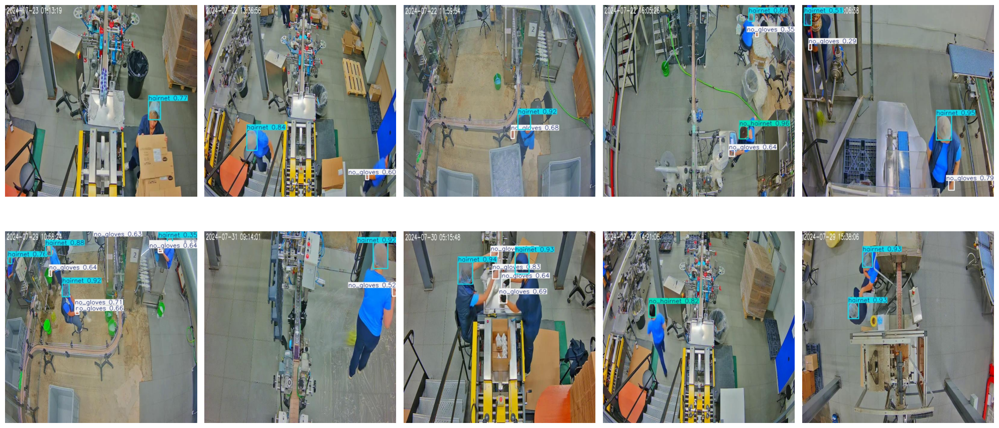

In [13]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Assuming 'results' contains the paths to the saved predicted images
# You might need to adjust the directory path based on your 'save' location
predicted_image_dir = '/content/runs/detect/train32' # Example path

# Get a list of image files in the prediction directory
image_files = [f for f in os.listdir(predicted_image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Take the first 10 image files for a 2x5 display
images_to_display = image_files[:10]

if len(images_to_display) < 10:
    print(f"Less than 10 images found in the prediction directory. Displaying {len(images_to_display)} images.")

# Create a 2x5 grid of subplots
fig, axes = plt.subplots(2, 5, figsize=(20, 10)) # Adjust figure size as needed

# Flatten the axes array for easy iteration
axes = axes.flatten()

for i, img_file in enumerate(images_to_display):
    if i < len(axes): # Ensure we don't go out of bounds if less than 10 images are found
        img_path = os.path.join(predicted_image_dir, img_file)
        img = mpimg.imread(img_path)
        axes[i].imshow(img)
        axes[i].axis('off') # Hide axes
    else:
        # Hide any unused subplots if less than 10 images are displayed
        for j in range(i, len(axes)):
            axes[j].axis('off')
        break


plt.tight_layout()
plt.show()

## Save Running Model

In [14]:
import os
from google.colab import files

# Define the directory you want to archive
directory_to_archive = '/content/runs'  # Or '/content/' to archive everything

# Define the name for the archive file
archive_filename = 'Performance.zip'

# Create a zip archive of the directory
# The -r option is for recursive, -q is for quiet (no output)
# Change directory to the parent of the directory to archive
%cd /content/

# Create the zip file
!zip -r /content/{archive_filename} {os.path.basename(directory_to_archive)}

# Download the archive file
files.download(archive_filename)

/content
  adding: runs/ (stored 0%)
  adding: runs/detect/ (stored 0%)
  adding: runs/detect/train/ (stored 0%)
  adding: runs/detect/train/R_curve.png (deflated 10%)
  adding: runs/detect/train/train_batch1.jpg (deflated 2%)
  adding: runs/detect/train/results.png (deflated 8%)
  adding: runs/detect/train/train_batch2.jpg (deflated 1%)
  adding: runs/detect/train/weights/ (stored 0%)
  adding: runs/detect/train/weights/last.pt (deflated 10%)
  adding: runs/detect/train/weights/best.pt (deflated 10%)
  adding: runs/detect/train/val_batch0_labels.jpg (deflated 6%)
  adding: runs/detect/train/args.yaml (deflated 53%)
  adding: runs/detect/train/F1_curve.png (deflated 8%)
  adding: runs/detect/train/train_batch0.jpg (deflated 1%)
  adding: runs/detect/train/confusion_matrix.png (deflated 28%)
  adding: runs/detect/train/confusion_matrix_normalized.png (deflated 26%)
  adding: runs/detect/train/labels.jpg (deflated 31%)
  adding: runs/detect/train/val_batch0_pred.jpg (deflated 6%)
  addin

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>